In [35]:
# pip install wordcloud
pip install pyqt5

SyntaxError: invalid syntax (Temp/ipykernel_29948/3341325006.py, line 2)

In [41]:
import pandas as pd
import matplotlib.pyplot as plt
from wordcloud import WordCloud
%matplotlib inline

In [36]:
pip install pyqt5

Note: you may need to restart the kernel to use updated packages.


In [2]:
df = pd.read_csv("preprocessed_data.csv")

In [3]:
df.head()

,drug_name,age,gender,condition,dosage,other_conditions,other_drugs_taken,ratings,rating_sentiment,benefits,side_effects,comments
0,abilify,26,female,bipolar disorder,15mg taken daily for the period of 12 weeks,NaN,"cymbalta, 90mg/daily",3,negative,i did not notice any benefit at all supposedly...,a very uncomfortable inner restlessness wa the...,i wa prescribed abilify 15mg daily to assist i...
1,abilify,29,female,bipolar,10mg taken 1/day for the period of 8 mos,"bipolar mood disorder, acne, asthma","zoloft, wellbutrin, clozepam, tretinoin, clind...",8,positive,i had severe depression with agitation and mix...,i became drowsy however with adequate sleep 10...,the abilify decreased the need for daily klono...
2,abilify,43,female,depressionxiety,2 mg taken daily for the period of 3 months,anxiety,lexapro,10,positive,within 1 week of taking the cocktail of abilif...,no side effect have been noticed,i take one pill of each 1st thing in the am i ...
3,abilify,50,female,depression not resolved with antidepressant drugs,started out at 5mg the 10 & last 15mg taken d...,"add, depression, poss. bipolar type 2, ptsd, a...","vyvance, ativan lisinopril, zantac, viville do...",2,negative,while on abilify i can honestly say the depres...,but it caused memory loss and again an inciden...,i am only taking ativan getting psychological ...
4,abilify,50,male,bipolar,2mg to start taken once daily for the period ...,anxiety,klonopin,2,negative,due to the short time taking drug,headache first morning at 4am that wa relieved...,not much to tell i wa just starting treatment ...


In [7]:
import dtale
d = dtale.show(df)
d.open_browser()

In [55]:
new_df = pd.read_csv("sentiment_key_phrases.csv")

In [56]:
new_df.columns

Index(['drug_name', 'age', 'gender', 'condition', 'dosage', 'other_conditions',
       'other_drugs_taken', 'ratings', 'rating_sentiment', 'benefits',
       'side_effects', 'comments', 'combined_statement',
       'combined_statement_overall_sentiment', 'combined_statement positive %',
       'combined_statement neutral %', 'combined_statement negative %',
       'benefits_key_phrases', 'side_effects_key_phrases',
       'comments_key_phrases', 'condition_key_phrases'],
      dtype='object')

In [27]:
# Get the top 5 drugs from dataframe 
top5_drug = pd.DataFrame(df['drug_name'].value_counts().head(5))
top5_drug.reset_index(inplace=True) 
top5_drug.columns = ['drug_name','count'] 
list_top5_drugs = list(top5_drug['drug_name']) 

# create empty dataframe 
wordcloud_df = pd.DataFrame(columns = 'drug_name,benefits_key_phrases,side_effects_key_phrases,comments_key_phrases'.split(',')) 

In [28]:
# load the data into the word cloud dataframe after appending all the key phrases for a drug 
for i in range(len(list_top5_drugs)): 
    benefits = '' 
    sideeffects = '' 
    comments = '' 
    print("Drug Name ",list_top5_drugs[i]) 
    for index,rows in new_df.iterrows(): 
        if rows['drug_name'] == list_top5_drugs[i]: 
            benefits = benefits + str(rows['benefits_key_phrases']) 
            sideeffects = sideeffects + str(rows['side_effects_key_phrases']) 
            comments = comments + str(rows['comments_key_phrases']) 
            wordcloud_df.loc[i] = [list_top5_drugs[i],benefits,sideeffects,comments]

Drug Name  lexapro
Drug Name  paxil
Drug Name  synthroid
Drug Name  zoloft
Drug Name  retin-a


In [50]:
wordcloud_df

,drug_name,benefits_key_phrases,side_effects_key_phrases,comments_key_phrases
0,lexapro,"clinical depression, depressive symptom, aggit...","difficult acheiving orgasm, particular concern...","side effect, medication, 10 mg, dosage, 20 mg,..."
1,paxil,"anxiety, lifeanxietymain benefit, panic attack...","rem sleep phase, significant side effect, medi...","20mg one tablet, paroxetine, 5 year, psycholog..."
2,synthroid,"one week, energy, drugclearer thinking, energy...","side effectpersistent cough, drugside effect, ...","blood chemical test, thyroid testosterone, dhe..."
3,zoloft,"depression, anxietythought process, thinkingbe...","weight gain, sexual disfunctionnannanunclear t...","post partum depression, treatment, adjustmentd..."
4,retin-a,"consistent basis, acne ha, occasiol, everyday,...",peeling dryness sun sensitivitymain side effec...,"dry skin redness irritation, small amount, ini..."


In [48]:
# Create a function that plots all the key phrases for a drug 
def wordcloud(df,cols): 
    for index,rows in df.iterrows(): 
        plt.figure(figsize=(50,50)) 
        for i in range(len(cols)): 
            wordcloud = WordCloud(max_font_size=50, max_words=100, background_color="white").generate(rows[cols[i]]) 
            plt.subplot(i+2, 3, i+1).set_title("Drug:"+rows['drug_name']+" " + str(cols[i]),fontsize=50)
            plt.plot()
            plt.imshow(wordcloud, interpolation='bilinear')
            plt.axis("off")
#             plt.show()

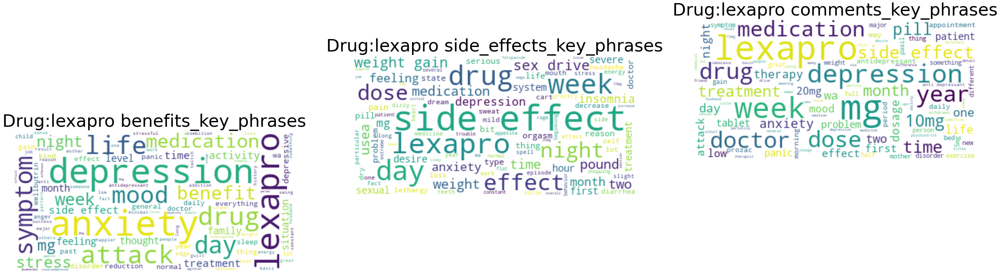

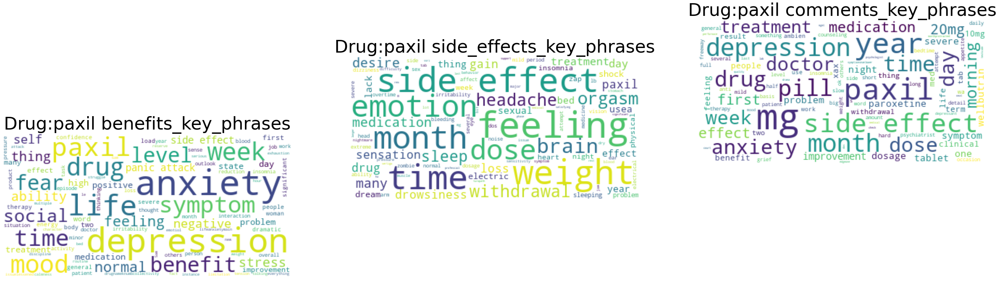

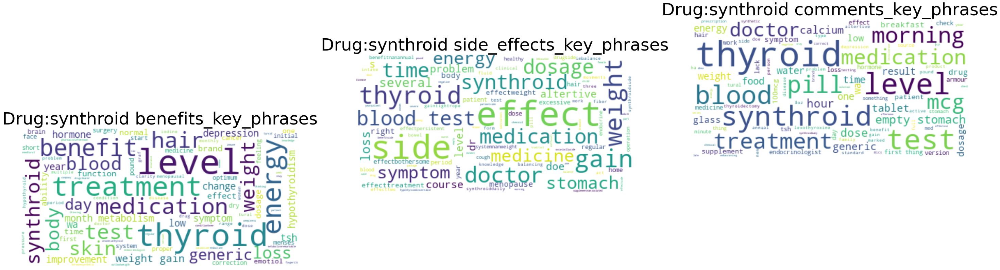

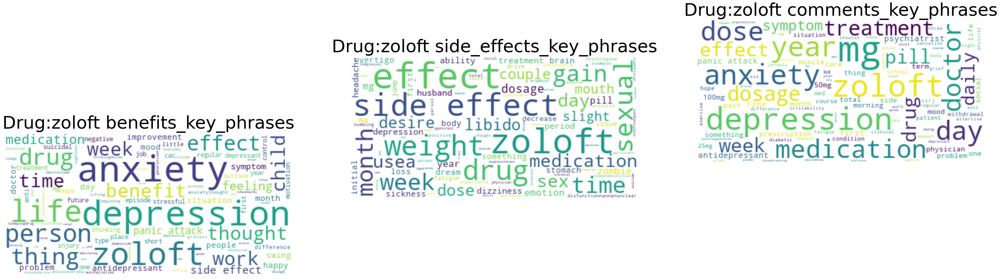

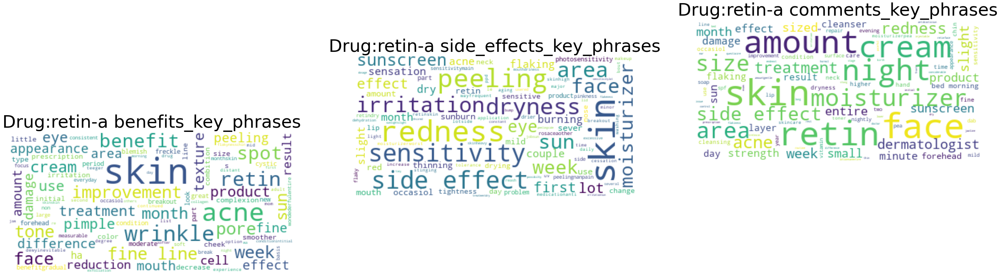

Executing shutdown due to inactivity...


2022-07-24 18:21:47,287 - INFO     - Executing shutdown due to inactivity...


Executing shutdown...


2022-07-24 18:21:51,362 - INFO     - Executing shutdown...
C:\Users\ashis\anaconda3\lib\site-packages\dtale\app.py:397: UserWarning:

The 'environ['werkzeug.server.shutdown']' function is deprecated and will be removed in Werkzeug 2.1.



In [49]:
# call the function with dataframe and columns 
wordcloud(wordcloud_df,['benefits_key_phrases','side_effects_key_phrases','comments_key_phrases']) 

In [68]:
# market analysis
# new_df.head()
new_df.drop([' conditions_0',
       ' conditions_1', ' conditions_2', ' conditions_3', 'conditions_0',
       'conditions_1', 'conditions_2', 'conditions_3'],axis=1,inplace=True)

In [69]:
new_df = new_df.join(new_df["condition_key_phrases"].str.split(",",expand=True).add_prefix("conditions_")) 
new_df.columns

Index(['drug_name', 'age', 'gender', 'condition', 'dosage', 'other_conditions',
       'other_drugs_taken', 'ratings', 'rating_sentiment', 'benefits',
       'side_effects', 'comments', 'combined_statement',
       'combined_statement_overall_sentiment', 'combined_statement positive %',
       'combined_statement neutral %', 'combined_statement negative %',
       'benefits_key_phrases', 'side_effects_key_phrases',
       'comments_key_phrases', 'condition_key_phrases', 'conditions_0',
       'conditions_1', 'conditions_2', 'conditions_3'],
      dtype='object')

In [70]:
# selected few columns 
new_df1 = new_df[['drug_name','conditions_0','conditions_1', 'conditions_2', 'conditions_3']] 
new_df1.head() 
# Top 3 conditions 
new_df1['conditions_0'].value_counts().head(3) 

depression    344
acne          221
anxiety       145
Name: conditions_0, dtype: int64

In [87]:
depression_df = new_df[new_df['conditions_0'].str.contains("depression").fillna("")==True][['drug_name','age','ratings','benefits_key_phrases','side_effects_key_phrases','combined_statement positive %',
       'combined_statement neutral %', 'combined_statement negative %']] 
depression_df.reset_index(drop=True, inplace=True) 
depression_df.head(3) 

,drug_name,age,ratings,benefits_key_phrases,side_effects_key_phrases,combined_statement positive %,combined_statement neutral %,combined_statement negative %
0,abilify,43,10,"unorganized person, appointment time, daily re...",side effect,0.94,0.03,0.04
1,abilify,50,2,"abilify, depression","judgement reasoning skill, memory loss, retail...",0.00,0.01,0.99
2,abilify,52,6,"week, change, fog",NaN,0.02,0.07,0.91


In [88]:
# list of drugs for depression 
depression = list(set(new_df[new_df['conditions_0'].str.contains('depression').fillna("")==True]['drug_name'])) 
print(depression)

['neurontin', 'xax', 'wellbutrin-sr', 'zoloft', 'lithium-carbote', 'celexa', 'citalopram', 'paxil', 'topamax', 'prozac', 'wellbutrin', 'remeron', 'abilify', 'effexor-xr', 'zyprexa', 'emsam', 'lamictal', 'diazepam', 'effexor', 'concerta', 'desyrel', 'cymbalta', 'nortriptyline', 'elavil', 'vyvanse', 'trazodone', 'seroquel', 'mirtazapine', 'ritalin', 'sarafem', 'paxil-cr', 'pristiq', 'lexapro', 'wellbutrin-xl', 'adderall', 'lamotrigine', 'dextroamphetamine']


In [89]:
depression_df.head()

,drug_name,age,ratings,benefits_key_phrases,side_effects_key_phrases,combined_statement positive %,combined_statement neutral %,combined_statement negative %
0,abilify,43,10,"unorganized person, appointment time, daily re...",side effect,0.94,0.03,0.04
1,abilify,50,2,"abilify, depression","judgement reasoning skill, memory loss, retail...",0.00,0.01,0.99
2,abilify,52,6,"week, change, fog",NaN,0.02,0.07,0.91
3,adderall,45,9,"concentration focus, fatigue, motivation",heartrate,0.20,0.52,0.28
4,adderall,28,5,"productivity ability, day","dry lip mouth teeth, tough time",0.01,0.02,0.97


In [90]:
# Convert data type to float 
print(depression_df.info())
depression_df['combined_statement positive %'] = pd.to_numeric(depression_df['combined_statement positive %'], downcast='float')
depression_df['combined_statement negative %'] = pd.to_numeric(depression_df['combined_statement negative %'], downcast='float') 
depression_df.info() 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 416 entries, 0 to 415
Data columns (total 8 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   drug_name                      416 non-null    object 
 1   age                            416 non-null    int64  
 2   ratings                        416 non-null    int64  
 3   benefits_key_phrases           398 non-null    object 
 4   side_effects_key_phrases       391 non-null    object 
 5   combined_statement positive %  416 non-null    float64
 6   combined_statement neutral %   416 non-null    float64
 7   combined_statement negative %  416 non-null    float64
dtypes: float64(3), int64(2), object(3)
memory usage: 26.1+ KB
None
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 416 entries, 0 to 415
Data columns (total 8 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0  

In [92]:
depression_overall_df = depression_df.groupby('drug_name').mean() 
depression_overall_df.reset_index(inplace=True) 
depression_overall_df.head() 

,drug_name,age,ratings,combined_statement positive %,combined_statement neutral %,combined_statement negative %
0,abilify,48.333333,6.000000,0.320000,0.036667,0.646667
1,adderall,37.500000,7.750000,0.305000,0.150000,0.542500
2,celexa,39.529412,6.411765,0.318824,0.040000,0.643529
3,citalopram,37.714286,6.619048,0.325714,0.044762,0.628571
4,concerta,40.000000,3.000000,0.970000,0.010000,0.030000


In [94]:
import dtale
d = dtale.show(depression_overall_df)
d.open_browser()

In [99]:
top5_neg = depression_overall_df[depression_overall_df['combined_statement negative %']>0.5] 
top5_neg.reset_index(drop=True, inplace=True) 
top5_neg = top5_neg.sort_values('combined_statement negative %',ascending=False).head(5).reset_index() 
top5_neg_drugs = list(top5_neg['drug_name']) 
wordcloud_df_neg = pd.DataFrame(columns = 'drug_name,benefits_key_phrases,side_effects_key_phrases'.split(',')) 
wordcloud_df_neg

for i in range(len(top5_neg_drugs)): 
    benefits = '' 
    sideeffects = '' 
    comments = '' 
    print("Drug Name ",top5_neg_drugs[i]) 
    for index,rows in new_df.iterrows():
        if rows['drug_name'] == top5_neg_drugs[i]: 
            benefits = benefits + str(rows['benefits_key_phrases']) 
            sideeffects = sideeffects + str(rows['side_effects_key_phrases'])  
            wordcloud_df_neg.loc[i] = [top5_neg_drugs[i],benefits,sideeffects] 
wordcloud_df_neg.head()

Drug Name  paxil-cr
Drug Name  diazepam
Drug Name  desyrel
Drug Name  xax
Drug Name  topamax


,drug_name,benefits_key_phrases,side_effects_key_phrases
0,paxil-cr,"inter dose withdrawl, depression anxiety, regu...","horrible withdrawl side effect, couple, doe, w..."
1,diazepam,"good thing, zydol, pain, dose, 50 mg, 100 mg, ...","unpleasant dream, diazepam, headache, thing, d..."
2,desyrel,"nanvivid dream, mild antidepressant, eight hou...","slight dry mouth, use, 4aftgernoons morning, a..."
3,xax,"pm week, treatment, anxiety, feeling, stress, ...","side effectanxiety, drug, memoryseveral day, s..."
4,topamax,"appetite impulse, stress reduction, anti depre...","blurry visionone pleasant side effect, small i..."


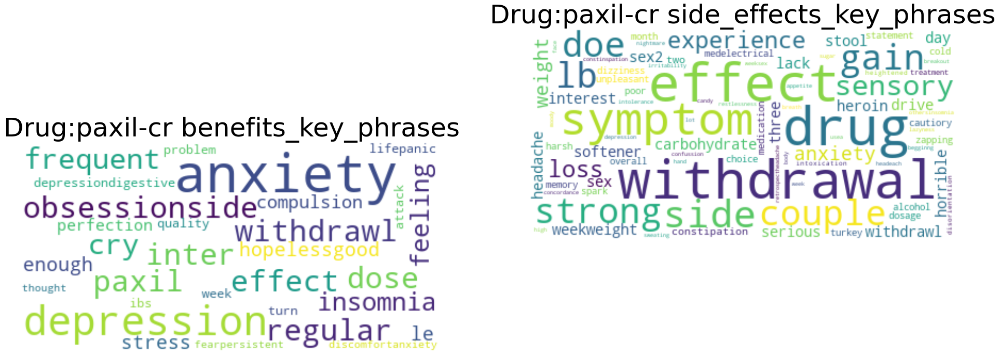

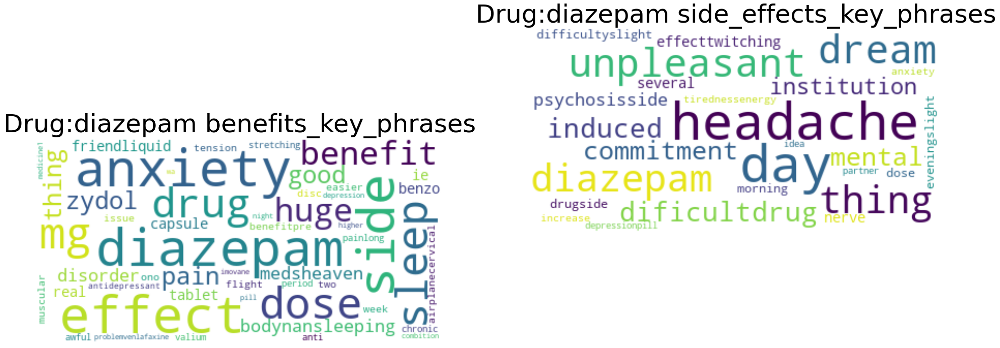

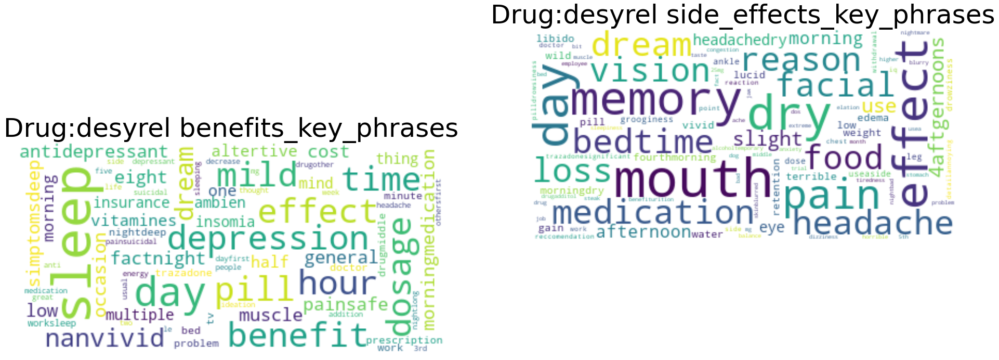

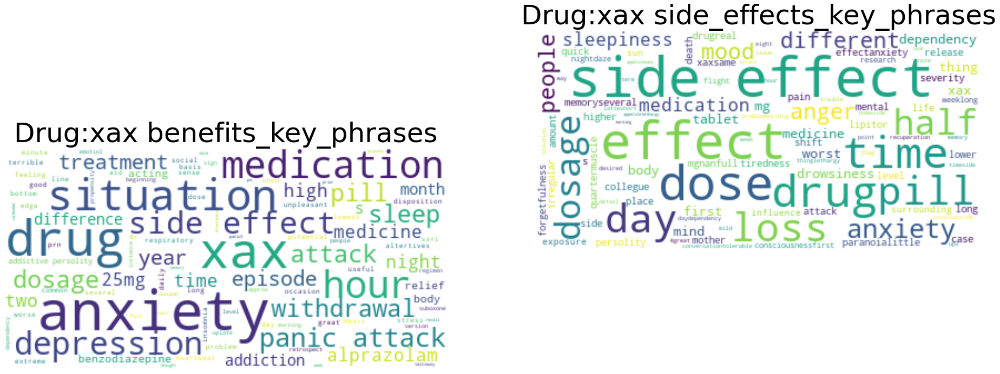

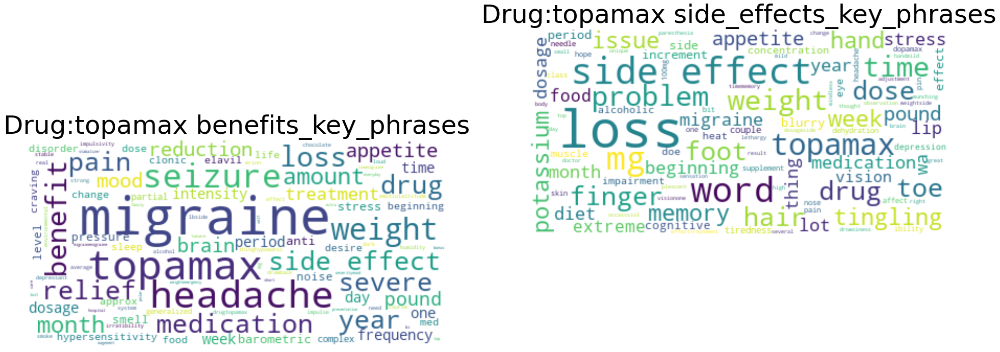

In [101]:
wordcloud(wordcloud_df_neg,['benefits_key_phrases','side_effects_key_phrases'])

In [102]:
top5_pos = depression_overall_df[depression_overall_df['combined_statement positive %']>0.5] 
top5_pos.reset_index(drop=True, inplace=True) 
top5_pos = top5_neg.sort_values('combined_statement positive %',ascending=False).head(5).reset_index() 
top5_pos_drugs = list(top5_neg['drug_name']) 
wordcloud_df_pos = pd.DataFrame(columns = 'drug_name,benefits_key_phrases,side_effects_key_phrases'.split(',')) 
wordcloud_df_pos

for i in range(len(top5_neg_drugs)): 
    benefits = '' 
    sideeffects = '' 
    comments = '' 
    print("Drug Name ",top5_neg_drugs[i]) 
    for index,rows in new_df.iterrows():
        if rows['drug_name'] == top5_pos_drugs[i]: 
            benefits = benefits + str(rows['benefits_key_phrases']) 
            sideeffects = sideeffects + str(rows['side_effects_key_phrases'])  
            wordcloud_df_pos.loc[i] = [top5_pos_drugs[i],benefits,sideeffects] 
wordcloud_df_pos.head()

Drug Name  concerta
Drug Name  dextroamphetamine
Drug Name  trazodone
Drug Name  nortriptyline
Drug Name  lithium-carbote


,drug_name,benefits_key_phrases,side_effects_key_phrases
0,concerta,"grade averaging c s, b s, dramatic increase, s...","side effect, school break, point, time, medica..."
1,dextroamphetamine,"depressionshort term memory lessened, obsessiv...","weight loss, appetitedry mouth, lot, water, so..."
2,trazodone,"nanrelief, insomnianightdifficult time, bednig...","side effect, other habit, coffee, drug, sleep,..."
3,nortriptyline,"joint muscle pain, productive day, ability, ni...","proper dosage, higher mgshaky hand shakiness, ..."
4,lithium-carbote,"mania, paniclittle le maniadifficult crisis, e...","first three year, severe acneupset stomach low..."


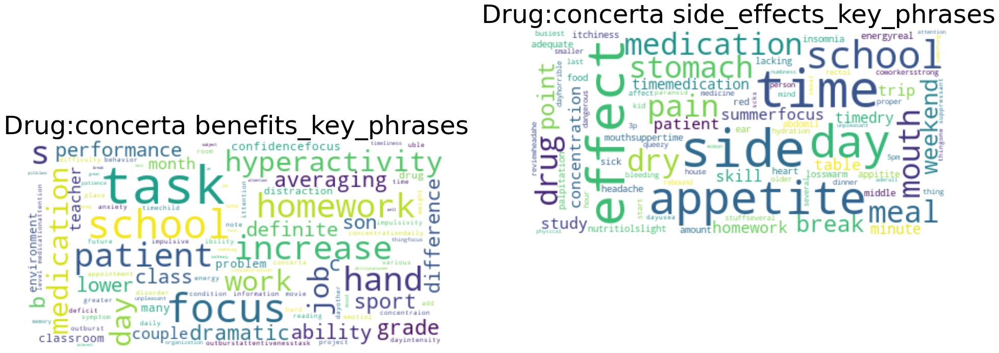

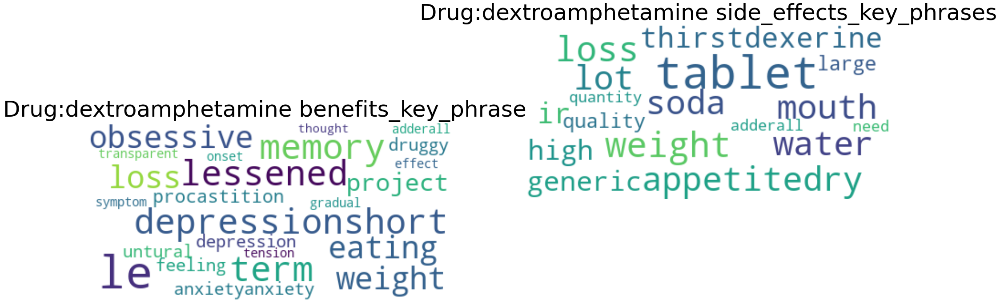

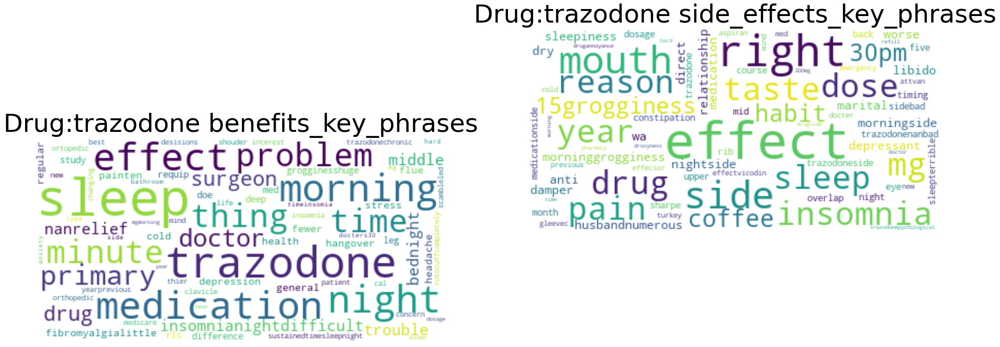

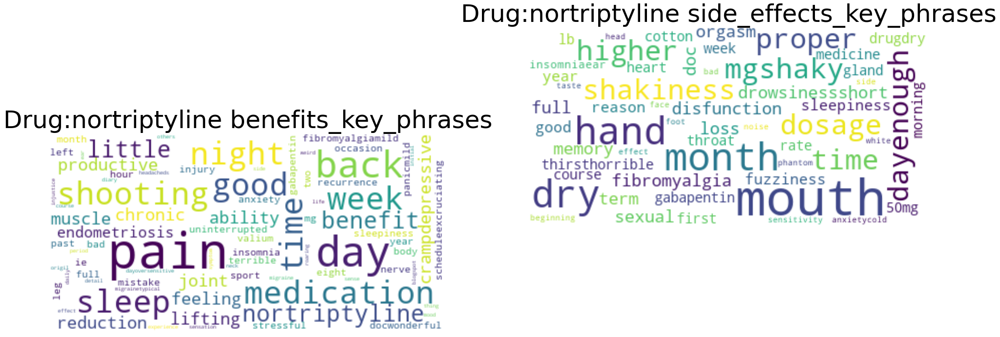

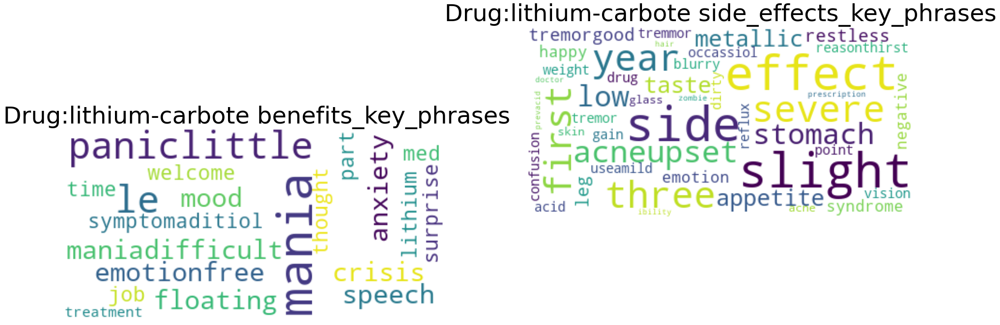

In [103]:
wordcloud(wordcloud_df_pos,['benefits_key_phrases','side_effects_key_phrases'])